In [1]:
import pandas as pd
import numpy as np
import missingno as msno
from IPython.display import display, HTML
display(HTML("<style>.container { width:70% !important; }</style>"))
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
pd.set_option('display.max_columns', None)
import math
import warnings
warnings.filterwarnings("ignore")

import plotly.offline as pyo
import plotly.graph_objs as go
# Set notebook mode to work in offline
pyo.init_notebook_mode()
import plotly.io as pio
# pio.renderers.default = 'notebook'
pio.renderers.default = "notebook_connected"

# helper functions

In [2]:
def plot_hist_stacked(df1, feature, title):
    
    df = df1.copy()

    df['Fraud Status'] = df['fraud_bool'].map({1: 'Fraud', 0: 'Non-Fraud'})

    fig = px.histogram(df, x=feature, color='Fraud Status',
                       barmode='overlay',  # Overlays the fraud and non-fraud histograms
                       nbins=50,  
                       color_discrete_map={'Fraud':'red', 'Non-Fraud':'green'}, 
                       labels={'Fraud Status':'Fraud Status', feature: feature},  
                       opacity=0.5,  
                       title=title) 

    fig.update_layout(xaxis_title=feature, yaxis_title='Count', legend_title='Fraud Status',
                      width=1800, height=800)  
    fig.show()

    try :
        df['{}_bin'.format(feature)] = pd.cut(df['{}'.format(feature)], bins=50)

        # Calculate the percentage distribution of Fraud Status within each credit_risk_score bin
        distribution = df.groupby(['{}_bin'.format(feature), 'Fraud Status']).size().unstack(fill_value=0)
        distribution_percentage = distribution.div(distribution.sum(axis=1), axis=0) * 100

        distribution_percentage.plot(kind='bar', stacked=True, figsize=(25, 10), color=['red', 'green'])

        plt.axhline(y=distribution_percentage['Fraud'].mean()) 
        plt.axhline(y=50, color='yellow') 

        plt.title(title)
        plt.xlabel('{}_bin'.format(feature))
        plt.ylabel('Percentage')
        plt.legend(title='Fraud Status')
        plt.xticks(rotation=75)

        plt.tight_layout
    except TypeError:
        print('cannot print stacked bar chart as cannot bin')

In [3]:
def plot_fraud_nonfraud(df):

    n_cols = len(df.columns) - 1
    cols_per_row = 4
    rows = math.ceil(n_cols / cols_per_row)

    fig, axs = plt.subplots(rows, cols_per_row, figsize=(20, 10 * rows), constrained_layout=True)

    # Flatten the axes array for easy indexing
    axs = axs.flatten()

    for i, feature in enumerate(df.columns.drop('fraud_bool')):
        # Separate the data by fraud_bool status
        data_fraud = df[df['fraud_bool'] == 1][feature].dropna()
        data_non_fraud = df[df['fraud_bool'] == 0][feature].dropna()

        # Create histograms for each category within the same subplot
        axs[i].hist(data_non_fraud, bins=50, alpha=0.5, label='Non-Fraud', color='green')
        axs[i].hist(data_fraud, bins=50, alpha=0.5, label='Fraud', color='red')

        # Set the title and legend for the subplot
        axs[i].set_title(feature)
        axs[i].legend()

    # Hide any unused subplots
    for j in range(i + 1, len(axs)):
        axs[j].set_visible(False)

    plt.tight_layout()
    plt.show()

In [4]:
def plot_distribution(df1):
    
    df = df1.copy()
    
    n_cols = len(df.columns) -1
    cols_per_row = 4
    rows = math.ceil(n_cols / cols_per_row)

    fig, axs = plt.subplots(rows, cols_per_row, figsize=(20, 10 * rows), constrained_layout=True)

    # Flatten the axes array for easy indexing
    axs = axs.flatten()

    for i, feature in enumerate(df.columns.drop('fraud_bool')):
        data = df[feature].dropna()

        # Create histograms for the feature
        axs[i].hist(data, bins=50, alpha=0.5, color='blue')

        # Set the title for the subplot
        axs[i].set_title(feature)
        

    # Hide any unused subplots
    for j in range(i + 1, len(axs)):
        axs[j].set_visible(False)

    plt.tight_layout()
    plt.show()

In [5]:
def plot_comparison(df1, df2):
    
    df = df1.copy()
    
    n_cols = len(df.columns) -1
    cols_per_row = 4
    rows = math.ceil(n_cols / cols_per_row)

    fig, axs = plt.subplots(rows, cols_per_row, figsize=(20, 10 * rows), constrained_layout=True)

    # Flatten the axes array for easy indexing
    axs = axs.flatten()

    for i, feature in enumerate(df.columns.drop('fraud_bool')):
        data = df[feature].dropna()
        axs[i].hist(data, bins=50, alpha=0.5,  label='filtered_df')
        axs[i].set_title(feature)
        
        data2 = df2[feature].dropna()
        axs[i].hist(data2, bins=50, alpha=0.5,  label='full_df')
        axs[i].set_title(feature)
        axs[i].legend()

    # Hide any unused subplots
    for j in range(i + 1, len(axs)):
        axs[j].set_visible(False)

    plt.tight_layout()
    plt.show()

In [287]:
df_cluster = pd.read_csv('kmeans_5_data.csv')
df_cluster.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 46178 entries, 0 to 46177
Data columns (total 28 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   fraud_bool                        46178 non-null  int64  
 1   income                            46178 non-null  float64
 2   name_email_similarity             46178 non-null  float64
 3   current_address_months_count      46178 non-null  float64
 4   customer_age                      46178 non-null  float64
 5   days_since_request                46178 non-null  float64
 6   payment_type                      46178 non-null  object 
 7   zip_count_4w                      46178 non-null  float64
 8   bank_branch_count_8w              46178 non-null  float64
 9   date_of_birth_distinct_emails_4w  46178 non-null  float64
 10  employment_status                 46178 non-null  object 
 11  credit_risk_score                 46178 non-null  float64
 12  emai

In [7]:
df_cluster.head()

,fraud_bool,income,name_email_similarity,current_address_months_count,customer_age,days_since_request,payment_type,zip_count_4w,bank_branch_count_8w,date_of_birth_distinct_emails_4w,employment_status,credit_risk_score,email_is_free,housing_status,phone_home_valid,phone_mobile_valid,bank_months_count,have_bank_months_count,has_other_cards,proposed_credit_limit,foreign_request,device_os,device_distinct_emails_8w,bank_integration,income_credit_limit_ratio,have_prev_address,have_initial_bal,kmeans_label
0,1,1.096490,-0.224123,1.091023,0.411913,-0.183025,AB,0.593571,-0.385933,-1.023087,CA,2.282134,0,BA,0,1,-0.962109,0,0,1.768627,0,windows,-0.146232,-0.874236,-0.849964,0,0,1
1,1,0.751423,1.148588,-0.500057,0.411913,-0.179548,AB,0.169694,-0.306011,-1.220021,CA,0.072556,0,BC,0,1,1.161571,0,0,1.768627,0,windows,-0.146232,0.754535,-0.893996,0,0,1
2,1,1.096490,-1.056003,2.806231,1.214189,-0.008408,AC,0.155731,-0.385933,0.552385,CA,1.889019,1,BB,0,1,-0.962109,0,0,1.768627,0,windows,-0.146232,-0.874236,-0.849964,0,0,1
3,1,0.751423,-1.257567,0.244704,-0.390363,-0.183757,AC,-0.938372,-0.385933,0.158517,CA,0.425004,1,BB,0,1,-0.962109,0,0,1.768627,0,windows,-0.146232,-0.874236,-0.893996,0,0,1
4,1,0.061288,-1.219784,1.226435,0.411913,-0.183809,AD,-0.518484,-0.379273,-1.220021,CA,1.143455,1,BA,0,1,0.753171,0,0,-0.126792,0,macintosh,-0.146232,0.441310,-0.453673,0,0,1


In [8]:
df_cluster[['kmeans_label', 'fraud_bool']].value_counts()

kmeans_label  fraud_bool
3             0             10839
4             0             10234
2             0              8998
1             0              7417
              1              3391
4             1              1580
3             1              1383
0             0               994
              1               729
2             1               613
dtype: int64

In [9]:
len(df_cluster[df_cluster['fraud_bool']==1])

7696

# all features

In [10]:
for col in df_cluster.drop(['fraud_bool', 'kmeans_label'], axis=1).columns:
    
    occurrences = df_cluster.groupby(["kmeans_label", col, "fraud_bool"]).size().reset_index(name="Occurrences")
    occurrences.sort_values("kmeans_label", inplace=True)
    fig = px.scatter(occurrences, x=col, y='kmeans_label', size="Occurrences", size_max=30, color='fraud_bool')
    fig.show()

In [11]:
df_cluster[df_cluster['fraud_bool']==1]['kmeans_label'].value_counts(normalize=True)

1    0.440619
4    0.205301
3    0.179704
0    0.094725
2    0.079652
Name: kmeans_label, dtype: float64

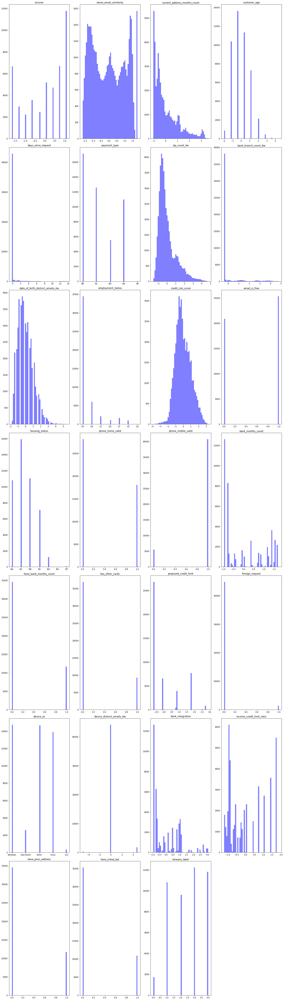

In [12]:
plot_distribution(df_cluster)

## housing_status = BA, label = 0 (71.8%, 0.54k)

In [142]:
df_cluster[(df_cluster['housing_status']=='BA') & (df_cluster['kmeans_label']==0)]['fraud_bool'].value_counts()

1    390
0    153
Name: fraud_bool, dtype: int64

In [141]:
df_cluster[(df_cluster['housing_status']=='BA') & (df_cluster['kmeans_label']==0)]['fraud_bool'].value_counts(normalize=True)

1    0.718232
0    0.281768
Name: fraud_bool, dtype: float64

# label = 1 (31.3%, 10.8k)

In [147]:
df_cluster[df_cluster['kmeans_label']==1]['fraud_bool'].value_counts()

0    7417
1    3391
Name: fraud_bool, dtype: int64

In [148]:
df_cluster[df_cluster['kmeans_label']==1]['fraud_bool'].value_counts(normalize=True)

0    0.686251
1    0.313749
Name: fraud_bool, dtype: float64

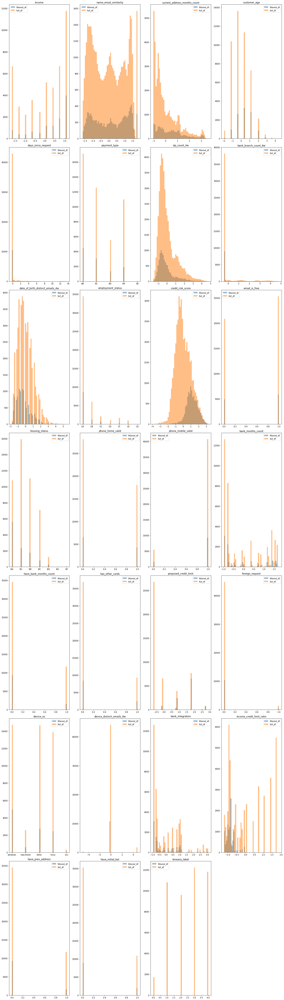

In [22]:
plot_comparison(df_cluster[df_cluster['kmeans_label']==1], df_cluster)

**Description**:
- credit_risk_score more left-skewed with a median of roughly 1
- device_os proportion of windows higher than original distribution 
- bank integration mostly <1.25 and even bigger proportion below feature's mean
- income_credit_limit_ratio below mean
- the rest quite similar to full data

In [23]:
for col in df_cluster.drop(['fraud_bool', 'kmeans_label'], axis=1).columns:
    
    temp_df = df_cluster[(df_cluster['kmeans_label'].isin([1]))]
    
    occurrences = temp_df.groupby(["kmeans_label", col, "fraud_bool"]).size().reset_index(name="Occurrences")
    occurrences.sort_values("kmeans_label", inplace=True)
    fig = px.scatter(occurrences, x=col, y='kmeans_label', size="Occurrences", size_max=30, color='fraud_bool')
    fig.show()

# label = 2 (6.4%, 9.6k)

In [149]:
df_cluster[df_cluster['kmeans_label']==2]['fraud_bool'].value_counts()

0    8998
1     613
Name: fraud_bool, dtype: int64

In [150]:
df_cluster[df_cluster['kmeans_label']==2]['fraud_bool'].value_counts(normalize=True)

0    0.936219
1    0.063781
Name: fraud_bool, dtype: float64

In [151]:
for col in df_cluster.drop(['fraud_bool', 'kmeans_label'], axis=1).columns:
    
    temp_df = df_cluster[(df_cluster['kmeans_label'].isin([2]))]
    
    occurrences = temp_df.groupby(["kmeans_label", col, "fraud_bool"]).size().reset_index(name="Occurrences")
    occurrences.sort_values("kmeans_label", inplace=True)
    fig = px.scatter(occurrences, x=col, y='kmeans_label', size="Occurrences", size_max=30, color='fraud_bool')
    fig.show()

## housing_status = BA (25.0%, 0.7k)

In [152]:
df_cluster[(df_cluster['kmeans_label']==2) & (df_cluster['housing_status']=='BA')]['fraud_bool'].value_counts()

0    532
1    177
Name: fraud_bool, dtype: int64

In [153]:
df_cluster[(df_cluster['kmeans_label']==2) & (df_cluster['housing_status']=='BA')]['fraud_bool'].value_counts(normalize=True)

0    0.750353
1    0.249647
Name: fraud_bool, dtype: float64

# label = 3 (11.3%, 12.2k)

In [154]:
df_cluster[df_cluster['kmeans_label']==3]['fraud_bool'].value_counts()

0    10839
1     1383
Name: fraud_bool, dtype: int64

In [155]:
df_cluster[df_cluster['kmeans_label']==3]['fraud_bool'].value_counts(normalize=True)

0    0.886843
1    0.113157
Name: fraud_bool, dtype: float64

In [156]:
for col in df_cluster.drop(['fraud_bool', 'kmeans_label'], axis=1).columns:
    
    temp_df = df_cluster[(df_cluster['kmeans_label'].isin([3]))]
    
    occurrences = temp_df.groupby(["kmeans_label", col, "fraud_bool"]).size().reset_index(name="Occurrences")
    occurrences.sort_values("kmeans_label", inplace=True)
    fig = px.scatter(occurrences, x=col, y='kmeans_label', size="Occurrences", size_max=30, color='fraud_bool')
    fig.show()

## housing_status = BA (32.0%, 1.9k)

In [157]:
df_cluster[(df_cluster['kmeans_label']==3) & (df_cluster['housing_status']=='BA')]['fraud_bool'].value_counts()

0    1342
1     639
Name: fraud_bool, dtype: int64

In [158]:
df_cluster[(df_cluster['kmeans_label']==3) & (df_cluster['housing_status']=='BA')]['fraud_bool'].value_counts(normalize=True)

0    0.677436
1    0.322564
Name: fraud_bool, dtype: float64

# label = 4 (13.4%, 11.8k)

In [41]:
df_cluster[df_cluster['kmeans_label']==4]['fraud_bool'].value_counts()

0    10234
1     1580
Name: fraud_bool, dtype: int64

In [42]:
df_cluster[df_cluster['kmeans_label']==4]['fraud_bool'].value_counts(normalize=True)

0    0.86626
1    0.13374
Name: fraud_bool, dtype: float64

In [43]:
for col in df_cluster.drop(['fraud_bool', 'kmeans_label'], axis=1).columns:
    
    temp_df = df_cluster[(df_cluster['kmeans_label'].isin([4]))]
    
    occurrences = temp_df.groupby(["kmeans_label", col, "fraud_bool"]).size().reset_index(name="Occurrences")
    occurrences.sort_values("kmeans_label", inplace=True)
    fig = px.scatter(occurrences, x=col, y='kmeans_label', size="Occurrences", size_max=30, color='fraud_bool')
    fig.show()

## housing_status = BA (35.6%, 1.9k)

In [171]:
df_cluster[(df_cluster['kmeans_label']==4) & (df_cluster['housing_status']=='BA')]['fraud_bool'].value_counts()

0    1236
1     682
Name: fraud_bool, dtype: int64

In [172]:
df_cluster[(df_cluster['kmeans_label']==4) & (df_cluster['housing_status']=='BA')]['fraud_bool'].value_counts(normalize=True)

0    0.644421
1    0.355579
Name: fraud_bool, dtype: float64

# label = 0 (42.3%, 1.7k)

In [159]:
df_cluster[df_cluster['kmeans_label']==0]['fraud_bool'].value_counts()

0    994
1    729
Name: fraud_bool, dtype: int64

In [160]:
df_cluster[df_cluster['kmeans_label']==0]['fraud_bool'].value_counts(normalize=True)

0    0.576901
1    0.423099
Name: fraud_bool, dtype: float64

In [161]:
for col in df_cluster.drop(['fraud_bool', 'kmeans_label'], axis=1).columns:
    
    temp_df = df_cluster[(df_cluster['kmeans_label'].isin([0]))]
    
    occurrences = temp_df.groupby(["kmeans_label", col, "fraud_bool"]).size().reset_index(name="Occurrences")
    occurrences.sort_values("kmeans_label", inplace=True)
    fig = px.scatter(occurrences, x=col, y='kmeans_label', size="Occurrences", size_max=30, color='fraud_bool')
    fig.show()

## date_of_birth_distinct_emails_4w > -1.4 (62.9%, 0.14k)

In [162]:
df_cluster[(df_cluster['kmeans_label']==0) & (df_cluster['date_of_birth_distinct_emails_4w']>1.4)]['fraud_bool'].value_counts()

0    90
1    53
Name: fraud_bool, dtype: int64

In [163]:
df_cluster[(df_cluster['kmeans_label']==0) & (df_cluster['date_of_birth_distinct_emails_4w']>1.4)]['fraud_bool'].value_counts(normalize=True)

0    0.629371
1    0.370629
Name: fraud_bool, dtype: float64

## device_os = windows (60.2%, 0.73k)

In [164]:
df_cluster[(df_cluster['kmeans_label']==0) & (df_cluster['device_os']=='windows')]['fraud_bool'].value_counts()

1    448
0    296
Name: fraud_bool, dtype: int64

In [165]:
df_cluster[(df_cluster['kmeans_label']==0) & (df_cluster['device_os']=='windows')]['fraud_bool'].value_counts(normalize=True)

1    0.602151
0    0.397849
Name: fraud_bool, dtype: float64

## credit_risk_score >= 0.4 (64.2%, 0.5k)

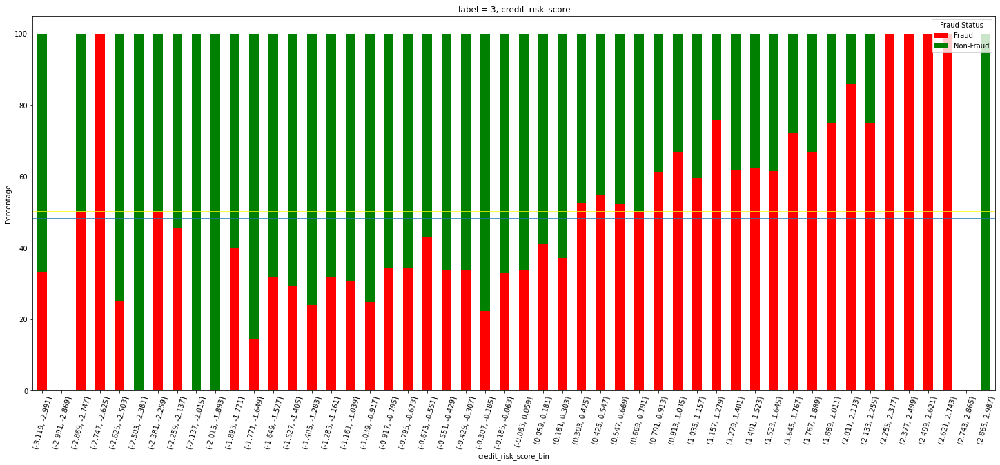

In [166]:
plot_hist_stacked(df_cluster[df_cluster['kmeans_label']==0], 'credit_risk_score', 'label = 3, credit_risk_score')

In [167]:
df_cluster[(df_cluster['kmeans_label']==0) & (df_cluster['credit_risk_score']>=0.4)]['fraud_bool'].value_counts()

1    321
0    179
Name: fraud_bool, dtype: int64

In [168]:
df_cluster[(df_cluster['kmeans_label']==0) & (df_cluster['credit_risk_score']>=0.4)]['fraud_bool'].value_counts(normalize=True)

1    0.642
0    0.358
Name: fraud_bool, dtype: float64

## housing_status = BA (71.8%, 0.54k)

In [169]:
df_cluster[(df_cluster['kmeans_label']==0) & (df_cluster['housing_status']=='BA')]['fraud_bool'].value_counts()

1    390
0    153
Name: fraud_bool, dtype: int64

In [170]:
df_cluster[(df_cluster['kmeans_label']==0) & (df_cluster['housing_status']=='BA')]['fraud_bool'].value_counts(normalize=True)

1    0.718232
0    0.281768
Name: fraud_bool, dtype: float64

# date_of_birth_distinct_emails_4w

In [46]:
occurrences = df_cluster.groupby(["kmeans_label", 'date_of_birth_distinct_emails_4w', "fraud_bool"]).size().reset_index(name="Occurrences")
occurrences.sort_values("kmeans_label", inplace=True)
fig = px.scatter(occurrences, x='date_of_birth_distinct_emails_4w', y='kmeans_label', size="Occurrences", size_max=30, color='fraud_bool')
fig.show()

## all

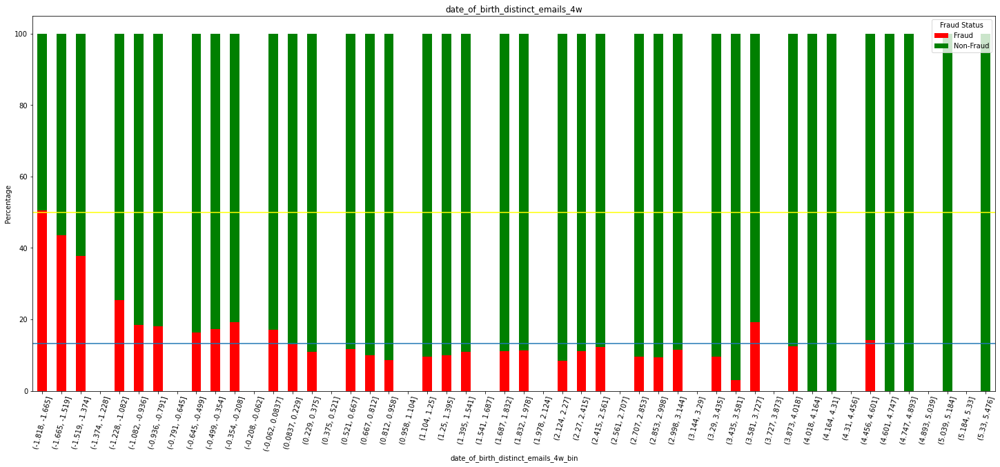

In [47]:
plot_hist_stacked(df_cluster, 'date_of_birth_distinct_emails_4w', 'date_of_birth_distinct_emails_4w')

## label = 1

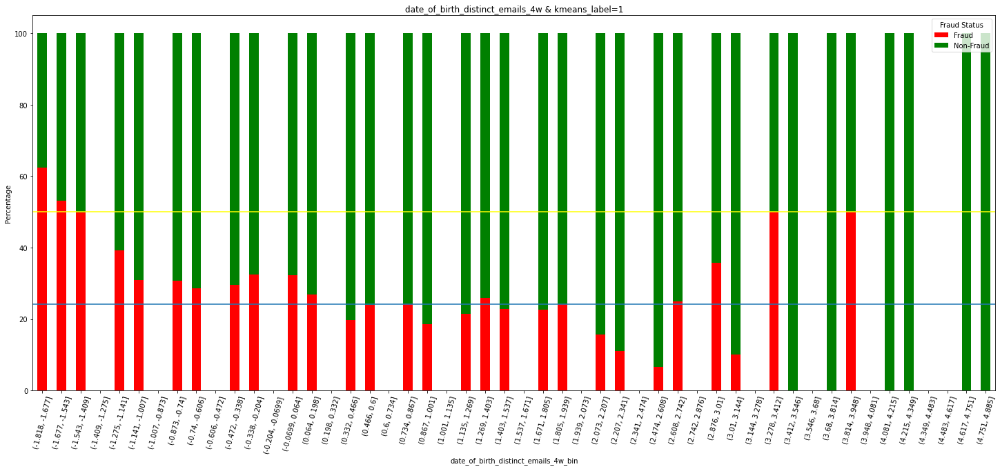

In [48]:
plot_hist_stacked(df_cluster[df_cluster['kmeans_label']==1], 'date_of_birth_distinct_emails_4w', 'date_of_birth_distinct_emails_4w & kmeans_label=1')

### date_of_birth_distinct_emails_4w <=-1.409, label = 1 (51.3%, 1.3k)

In [49]:
df_cluster[(df_cluster['date_of_birth_distinct_emails_4w']<=-1.409) & (df_cluster['kmeans_label']==1)]['fraud_bool'].value_counts()

1    662
0    628
Name: fraud_bool, dtype: int64

In [50]:
df_cluster[(df_cluster['date_of_birth_distinct_emails_4w']<=-1.409) & (df_cluster['kmeans_label']==1)]['fraud_bool'].value_counts(normalize=True)

1    0.513178
0    0.486822
Name: fraud_bool, dtype: float64

# credit_risk_score

In [173]:
occurrences = df_cluster.groupby(["kmeans_label", 'credit_risk_score', "fraud_bool"]).size().reset_index(name="Occurrences")
occurrences.sort_values("kmeans_label", inplace=True)
fig = px.scatter(occurrences, x='credit_risk_score', y='kmeans_label', size="Occurrences", size_max=30, color='fraud_bool')
fig.show()

## all

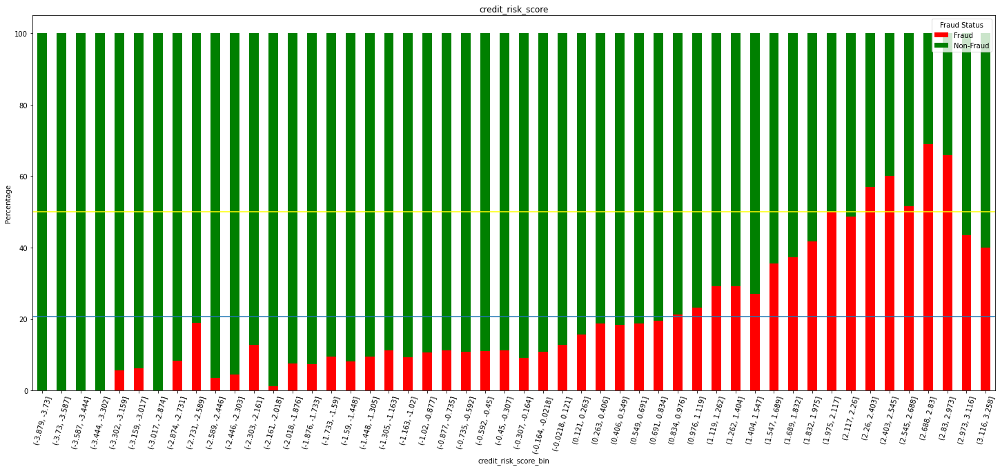

In [52]:
plot_hist_stacked(df_cluster, 'credit_risk_score', 'credit_risk_score')

### credit_risk_score >= 2.2 (57.0%, 0.97k)

In [53]:
df_cluster[(df_cluster['credit_risk_score']>=2.2)]['fraud_bool'].value_counts()

1    553
0    418
Name: fraud_bool, dtype: int64

In [54]:
df_cluster[(df_cluster['credit_risk_score']>=2.2)]['fraud_bool'].value_counts(normalize=True)

1    0.569516
0    0.430484
Name: fraud_bool, dtype: float64

# device_os (30.6%, 14.7k)

In [58]:
occurrences = df_cluster.groupby(["kmeans_label", 'device_os', "fraud_bool"]).size().reset_index(name="Occurrences")
occurrences.sort_values("kmeans_label", inplace=True)
fig = px.scatter(occurrences, x='device_os', y='kmeans_label', size="Occurrences", size_max=30, color='fraud_bool')
fig.show()

In [59]:
df_cluster[(df_cluster['device_os']=='windows') ]['fraud_bool'].value_counts()

0    10220
1     4515
Name: fraud_bool, dtype: int64

In [60]:
df_cluster[(df_cluster['device_os']=='windows') ]['fraud_bool'].value_counts(normalize=True)

0    0.693587
1    0.306413
Name: fraud_bool, dtype: float64

## device+os = windows, label = 0 (60.2%, 0.73k)

In [174]:
df_cluster[(df_cluster['device_os']=='windows') & (df_cluster['kmeans_label']==0)]['fraud_bool'].value_counts()

1    448
0    296
Name: fraud_bool, dtype: int64

In [175]:
df_cluster[(df_cluster['device_os']=='windows') & (df_cluster['kmeans_label']==0)]['fraud_bool'].value_counts(normalize=True)

1    0.602151
0    0.397849
Name: fraud_bool, dtype: float64

## device_os = windows, label = 1 (45.9%, 4.9k)

In [63]:
df_cluster[(df_cluster['device_os']=='windows') & (df_cluster['kmeans_label'].isin([1]))]['fraud_bool'].value_counts()

0    2684
1    2274
Name: fraud_bool, dtype: int64

In [64]:
df_cluster[(df_cluster['device_os']=='windows') & (df_cluster['kmeans_label'].isin([1]))]['fraud_bool'].value_counts(normalize=True)

0    0.541347
1    0.458653
Name: fraud_bool, dtype: float64

In [65]:
for col in df_cluster.drop(['fraud_bool', 'kmeans_label'], axis=1).columns:
    
    temp_df = df_cluster[(df_cluster['device_os']=='windows') & (df_cluster['kmeans_label'].isin([1]))]
    
    occurrences = temp_df.groupby(["kmeans_label", col, "fraud_bool"]).size().reset_index(name="Occurrences")
    occurrences.sort_values("kmeans_label", inplace=True)
    fig = px.scatter(occurrences, x=col, y='kmeans_label', size="Occurrences", size_max=30, color='fraud_bool')
    fig.show()

### income > 1 (57.1%, 2k)

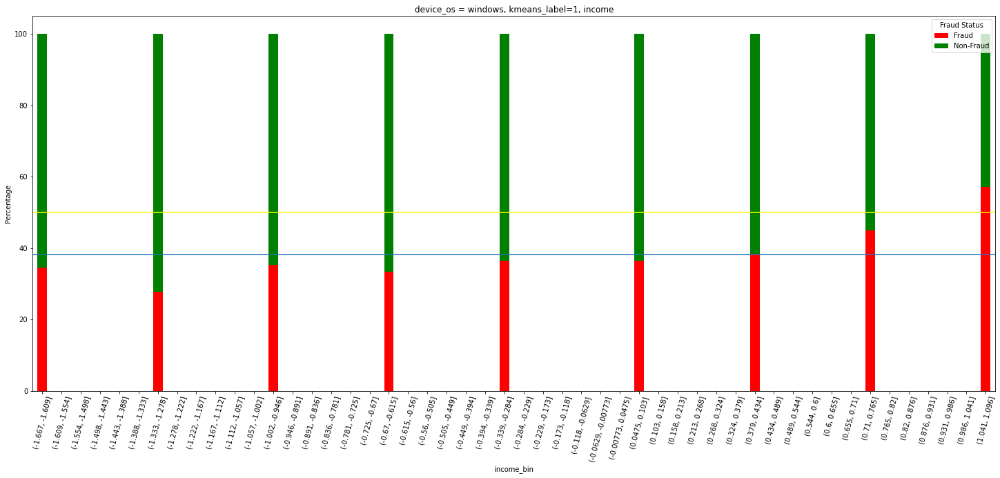

In [66]:
plot_hist_stacked(df_cluster[(df_cluster['device_os']=='windows') & (df_cluster['kmeans_label'].isin([1]))], 'income', 'device_os = windows, kmeans_label=1, income')

In [67]:
df_cluster[(df_cluster['device_os']=='windows') & (df_cluster['kmeans_label'].isin([1])) & (df_cluster['income']>1)]['fraud_bool'].value_counts()

1    1161
0     871
Name: fraud_bool, dtype: int64

In [68]:
df_cluster[(df_cluster['device_os']=='windows') & (df_cluster['kmeans_label'].isin([1])) & (df_cluster['income']>1)]['fraud_bool'].value_counts(normalize=True)

1    0.571358
0    0.428642
Name: fraud_bool, dtype: float64

### payment type = AC (57.0%, 1.45k)

In [69]:
plot_hist_stacked(df_cluster[(df_cluster['device_os']=='windows') & (df_cluster['kmeans_label'].isin([1]))], 'payment_type', 'device_os = windows, kmeans_label=1, payment_type')

cannot print stacked bar chart as cannot bin


In [70]:
df_cluster[(df_cluster['device_os']=='windows') & (df_cluster['kmeans_label'].isin([1])) & (df_cluster['payment_type'].isin(['AC']))]['fraud_bool'].value_counts()

1    834
0    629
Name: fraud_bool, dtype: int64

In [71]:
df_cluster[(df_cluster['device_os']=='windows') & (df_cluster['kmeans_label'].isin([1])) & (df_cluster['payment_type'].isin(['AC']))]['fraud_bool'].value_counts(normalize=True)

1    0.570062
0    0.429938
Name: fraud_bool, dtype: float64

### bank_branch_count_8w < -0.385 (59.3%, 1.75k)

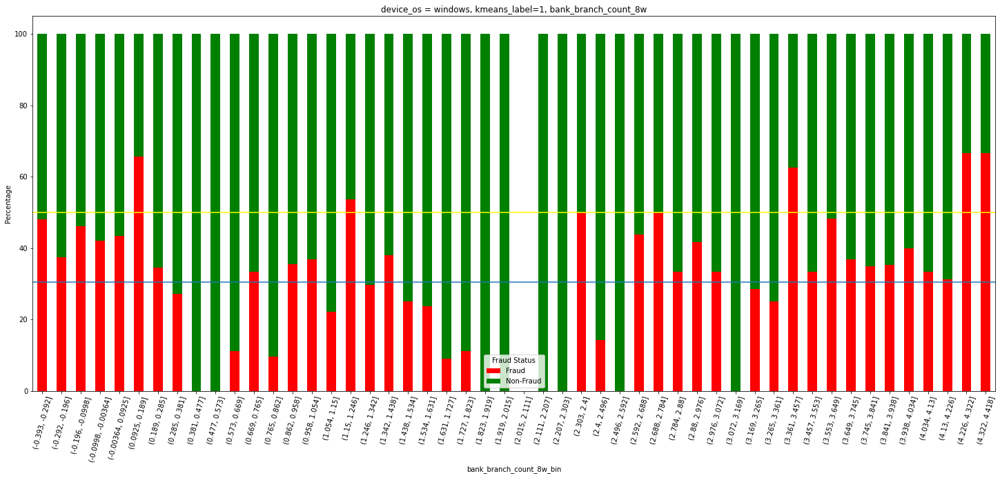

In [72]:
plot_hist_stacked(df_cluster[(df_cluster['device_os']=='windows') & (df_cluster['kmeans_label'].isin([1]))], 'bank_branch_count_8w', 'device_os = windows, kmeans_label=1, bank_branch_count_8w')

In [73]:
temp_df = df_cluster[(df_cluster['device_os']=='windows') & (df_cluster['kmeans_label'].isin([1]))]
    
occurrences = temp_df.groupby(["kmeans_label", 'bank_branch_count_8w', "fraud_bool"]).size().reset_index(name="Occurrences")
occurrences.sort_values("kmeans_label", inplace=True)
fig = px.scatter(occurrences, x='bank_branch_count_8w', y='kmeans_label', size="Occurrences", size_max=30, color='fraud_bool')
fig.show()

In [74]:
df_cluster[(df_cluster['device_os']=='windows') & (df_cluster['kmeans_label'].isin([1])) & (df_cluster['bank_branch_count_8w']<-0.385)]['fraud_bool'].value_counts()

1    993
0    760
Name: fraud_bool, dtype: int64

In [75]:
df_cluster[(df_cluster['device_os']=='windows') & (df_cluster['kmeans_label'].isin([1])) & (df_cluster['bank_branch_count_8w']<-0.386)]['fraud_bool'].value_counts(normalize=True)

1    0.592849
0    0.407151
Name: fraud_bool, dtype: float64

### date_of_birth_distinct_emails_4w <= -1.22 (59.5%, 1.8k)

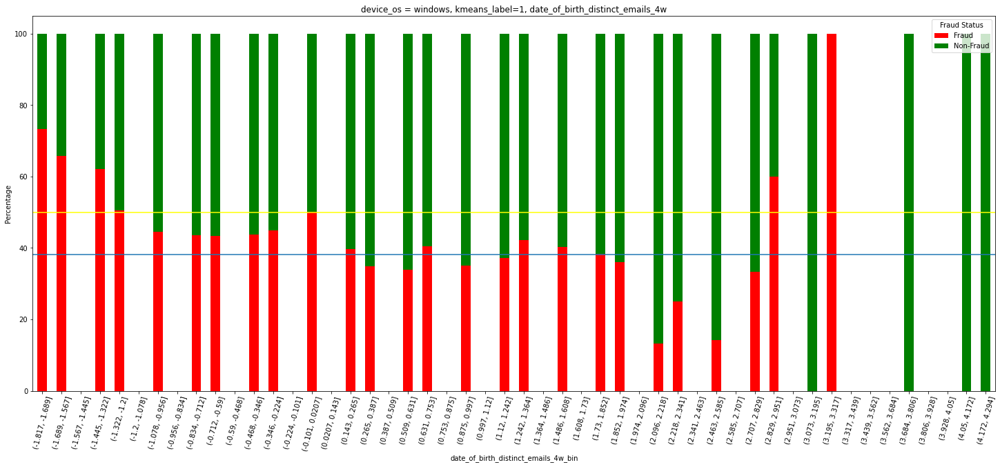

In [76]:
plot_hist_stacked(df_cluster[(df_cluster['device_os']=='windows') & (df_cluster['kmeans_label'].isin([1]))], 'date_of_birth_distinct_emails_4w', 'device_os = windows, kmeans_label=1, date_of_birth_distinct_emails_4w')

In [77]:
df_cluster[(df_cluster['device_os']=='windows') & (df_cluster['kmeans_label'].isin([1])) & (df_cluster['date_of_birth_distinct_emails_4w'] < -1.22)]['fraud_bool'].value_counts()

1    644
0    439
Name: fraud_bool, dtype: int64

In [78]:
df_cluster[(df_cluster['device_os']=='windows') & (df_cluster['kmeans_label'].isin([1])) & (df_cluster['date_of_birth_distinct_emails_4w'] < -1.22)]['fraud_bool'].value_counts(normalize=True)

1    0.594645
0    0.405355
Name: fraud_bool, dtype: float64

### credit_risk_score >= 1.6 (60.6%, 1.6k)

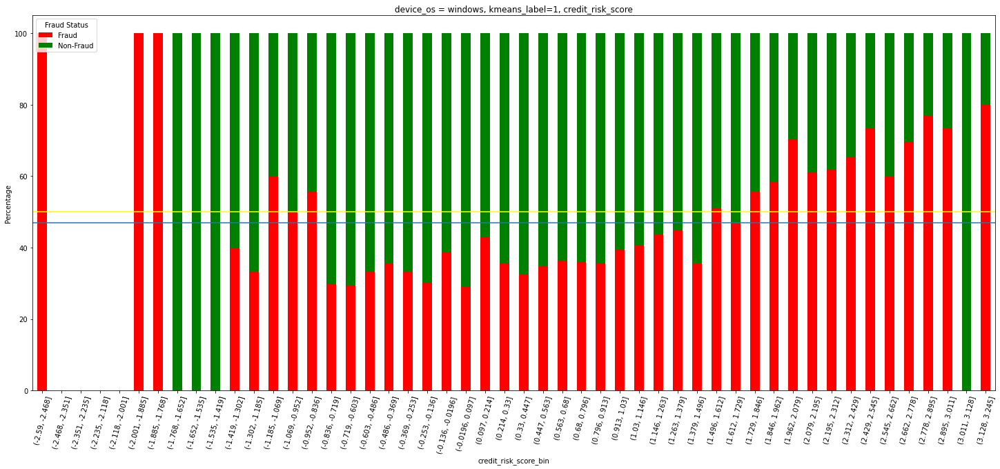

In [79]:
plot_hist_stacked(df_cluster[(df_cluster['device_os']=='windows') & (df_cluster['kmeans_label'].isin([1]))], 'credit_risk_score', 'device_os = windows, kmeans_label=1, credit_risk_score')

In [80]:
df_cluster[(df_cluster['device_os']=='windows') & (df_cluster['kmeans_label'].isin([1])) & (df_cluster['credit_risk_score']>=1.6)]['fraud_bool'].value_counts()

1    967
0    629
Name: fraud_bool, dtype: int64

In [81]:
df_cluster[(df_cluster['device_os']=='windows') & (df_cluster['kmeans_label'].isin([1])) & (df_cluster['credit_risk_score']>=1.6)]['fraud_bool'].value_counts(normalize=True)

1    0.60589
0    0.39411
Name: fraud_bool, dtype: float64

### housing status = BA (57.3%, 3k)

In [82]:
plot_hist_stacked(df_cluster[(df_cluster['device_os']=='windows') & (df_cluster['kmeans_label'].isin([1]))], 'housing_status', 'device_os = windows, kmeans_label=1, housing_status')

cannot print stacked bar chart as cannot bin


In [83]:
df_cluster[(df_cluster['device_os']=='windows') & (df_cluster['kmeans_label'].isin([1])) & (df_cluster['housing_status']=='BA')]['fraud_bool'].value_counts()

1    1723
0    1284
Name: fraud_bool, dtype: int64

In [84]:
df_cluster[(df_cluster['device_os']=='windows') & (df_cluster['kmeans_label'].isin([1])) & (df_cluster['housing_status']=='BA')]['fraud_bool'].value_counts(normalize=True)

1    0.572996
0    0.427004
Name: fraud_bool, dtype: float64

In [85]:
for col in df_cluster.drop(['fraud_bool', 'kmeans_label'], axis=1).columns:
    
    temp_df = df_cluster[(df_cluster['device_os']=='windows') & (df_cluster['kmeans_label'].isin([1])) & (df_cluster['housing_status']=='BA')]
    
    occurrences = temp_df.groupby(["kmeans_label", col, "fraud_bool"]).size().reset_index(name="Occurrences")
    occurrences.sort_values("kmeans_label", inplace=True)
    fig = px.scatter(occurrences, x=col, y='kmeans_label', size="Occurrences", size_max=30, color='fraud_bool')
    fig.show()

#### income >= 1 (65.9%, 1.4k)

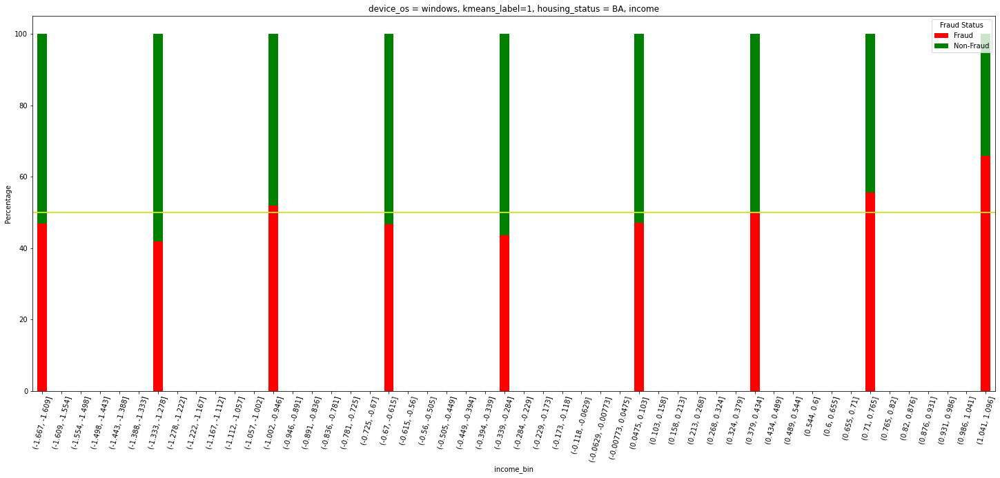

In [86]:
plot_hist_stacked(df_cluster[(df_cluster['device_os']=='windows') &\
                             (df_cluster['kmeans_label'].isin([1])) &\
                            (df_cluster['housing_status']=='BA')\
                            ], 'income', 'device_os = windows, kmeans_label=1, housing_status = BA, income')

In [87]:
temp_df = df_cluster[(df_cluster['device_os']=='windows') & (df_cluster['kmeans_label'].isin([1])) & (df_cluster['housing_status']=='BA')]

occurrences = temp_df.groupby(["kmeans_label", 'income', "fraud_bool"]).size().reset_index(name="Occurrences")
occurrences.sort_values("kmeans_label", inplace=True)
fig = px.scatter(occurrences, x='income', y='kmeans_label', size="Occurrences", size_max=30, color='fraud_bool')
fig.show()

In [88]:
df_cluster[(df_cluster['device_os']=='windows') &\
           (df_cluster['kmeans_label'].isin([1])) &\
           (df_cluster['housing_status']=='BA') &\
           (df_cluster['income']>=1)]['fraud_bool'].value_counts()

1    924
0    479
Name: fraud_bool, dtype: int64

In [89]:
df_cluster[(df_cluster['device_os']=='windows') &\
           (df_cluster['kmeans_label'].isin([1])) &\
           (df_cluster['housing_status']=='BA') &\
           (df_cluster['income']>=1)]['fraud_bool'].value_counts(normalize=True)

1    0.658589
0    0.341411
Name: fraud_bool, dtype: float64

#### customer_age > 1 (60.9%, 1.4k)

In [90]:
temp_df = df_cluster[(df_cluster['device_os']=='windows') & (df_cluster['kmeans_label'].isin([1])) & (df_cluster['housing_status']=='BA')]

occurrences = temp_df.groupby(["kmeans_label", 'customer_age', "fraud_bool"]).size().reset_index(name="Occurrences")
occurrences.sort_values("kmeans_label", inplace=True)
fig = px.scatter(occurrences, x='customer_age', y='kmeans_label', size="Occurrences", size_max=30, color='fraud_bool')
fig.show()

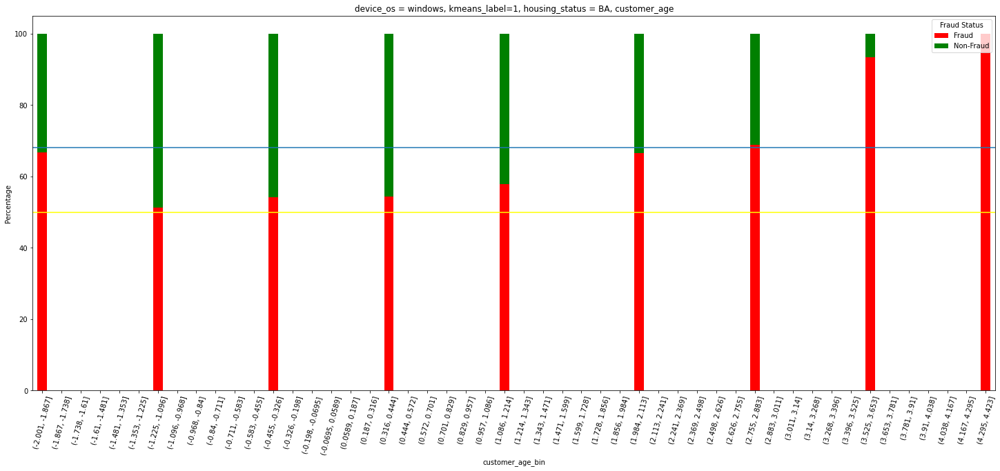

In [91]:
plot_hist_stacked(df_cluster[(df_cluster['device_os']=='windows') &\
                             (df_cluster['kmeans_label'].isin([1])) &\
                            (df_cluster['housing_status']=='BA')\
                            ], 'customer_age', 'device_os = windows, kmeans_label=1, housing_status = BA, customer_age')

In [92]:
df_cluster[(df_cluster['device_os']=='windows') &\
           (df_cluster['kmeans_label'].isin([1])) &\
           (df_cluster['housing_status']=='BA') &\
           (df_cluster['customer_age']> 1)]['fraud_bool'].value_counts()

1    863
0    555
Name: fraud_bool, dtype: int64

In [93]:
df_cluster[(df_cluster['device_os']=='windows') &\
           (df_cluster['kmeans_label'].isin([1])) &\
           (df_cluster['housing_status']=='BA') &\
           (df_cluster['customer_age']> 1)]['fraud_bool'].value_counts(normalize=True)

1    0.608604
0    0.391396
Name: fraud_bool, dtype: float64

#### payment_type = AC (67.9%, 0.95k)

In [94]:
plot_hist_stacked(df_cluster[(df_cluster['device_os']=='windows') &\
                             (df_cluster['kmeans_label'].isin([1])) &\
                            (df_cluster['housing_status']=='BA')\
                            ], 'payment_type', 'device_os = windows, kmeans_label=1, housing_status = BA, payment_type')

cannot print stacked bar chart as cannot bin


In [95]:
df_cluster[(df_cluster['device_os']=='windows') &\
           (df_cluster['kmeans_label'].isin([1])) &\
           (df_cluster['housing_status']=='BA') &\
           (df_cluster['payment_type'].isin(['AC']))]['fraud_bool'].value_counts()

1    644
0    305
Name: fraud_bool, dtype: int64

In [96]:
df_cluster[(df_cluster['device_os']=='windows') &\
           (df_cluster['kmeans_label'].isin([1])) &\
           (df_cluster['housing_status']=='BA') &\
           (df_cluster['payment_type'].isin(['AC']))]['fraud_bool'].value_counts(normalize=True)

1    0.678609
0    0.321391
Name: fraud_bool, dtype: float64

#### bank_branch_count_8w <= 0.189 (59.1%, 2.6k)

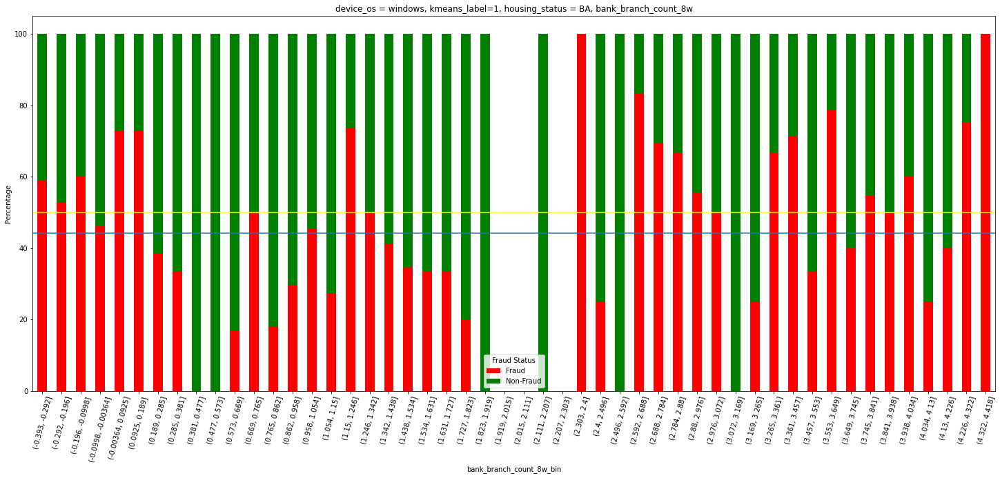

In [97]:
plot_hist_stacked(df_cluster[(df_cluster['device_os']=='windows') &\
                             (df_cluster['kmeans_label'].isin([1])) &\
                            (df_cluster['housing_status']=='BA')\
                            ], 'bank_branch_count_8w', 'device_os = windows, kmeans_label=1, housing_status = BA, bank_branch_count_8w')

In [98]:
df_cluster[(df_cluster['device_os']=='windows') &\
           (df_cluster['kmeans_label'].isin([1])) &\
           (df_cluster['housing_status']=='BA') &\
           (df_cluster['bank_branch_count_8w']<=0.189)]['fraud_bool'].value_counts()

1    1564
0    1084
Name: fraud_bool, dtype: int64

In [99]:
df_cluster[(df_cluster['device_os']=='windows') &\
           (df_cluster['kmeans_label'].isin([1])) &\
           (df_cluster['housing_status']=='BA') &\
           (df_cluster['bank_branch_count_8w']<=0.189)]['fraud_bool'].value_counts(normalize=True)

1    0.590634
0    0.409366
Name: fraud_bool, dtype: float64

#### date_of_birth_distinct_emails_4w <=0.0207 (59.0%, 2.38k)

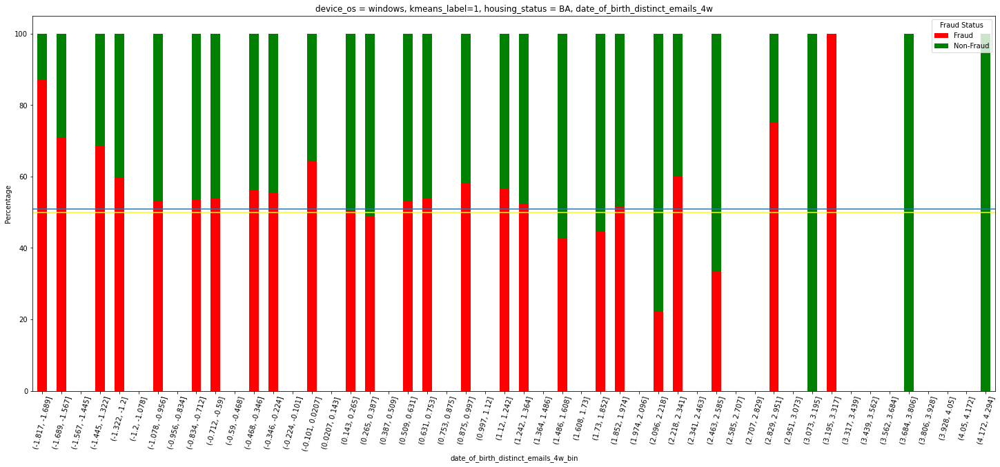

In [100]:
plot_hist_stacked(df_cluster[(df_cluster['device_os']=='windows') &\
                             (df_cluster['kmeans_label'].isin([1])) &\
                            (df_cluster['housing_status']=='BA')\
                            ], 'date_of_birth_distinct_emails_4w', 'device_os = windows, kmeans_label=1, housing_status = BA, date_of_birth_distinct_emails_4w')

In [101]:
df_cluster[(df_cluster['device_os']=='windows') &\
           (df_cluster['kmeans_label'].isin([1])) &\
           (df_cluster['housing_status']=='BA') &\
           (df_cluster['date_of_birth_distinct_emails_4w']<=0.0207)]['fraud_bool'].value_counts()

1    1402
0     976
Name: fraud_bool, dtype: int64

In [102]:
df_cluster[(df_cluster['device_os']=='windows') &\
           (df_cluster['kmeans_label'].isin([1])) &\
           (df_cluster['housing_status']=='BA') &\
           (df_cluster['date_of_birth_distinct_emails_4w']<=0.0207)]['fraud_bool'].value_counts(normalize=True)

1    0.589571
0    0.410429
Name: fraud_bool, dtype: float64

#### bank_months_count <= 0.91 (68.4%, 0.9k)

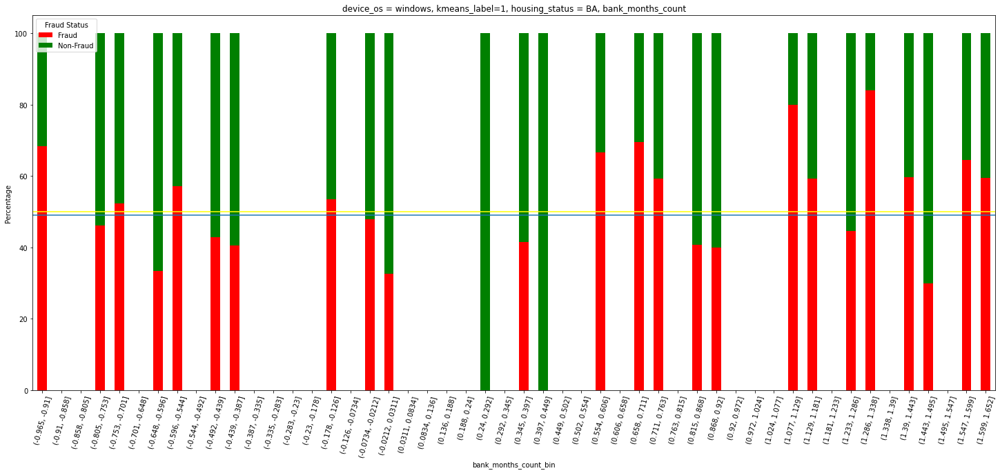

In [103]:
plot_hist_stacked(df_cluster[(df_cluster['device_os']=='windows') &\
                             (df_cluster['kmeans_label'].isin([1])) &\
                            (df_cluster['housing_status']=='BA')\
                            ], 'bank_months_count', 'device_os = windows, kmeans_label=1, housing_status = BA, bank_months_count')

In [104]:
df_cluster[(df_cluster['device_os']=='windows') &\
           (df_cluster['kmeans_label'].isin([1])) &\
           (df_cluster['housing_status']=='BA') &\
           (df_cluster['bank_months_count']<=-0.91)]['fraud_bool'].value_counts()

1    646
0    298
Name: fraud_bool, dtype: int64

In [105]:
df_cluster[(df_cluster['device_os']=='windows') &\
           (df_cluster['kmeans_label'].isin([1])) &\
           (df_cluster['housing_status']=='BA') &\
           (df_cluster['bank_months_count']<=-0.91)]['fraud_bool'].value_counts(normalize=True)

1    0.684322
0    0.315678
Name: fraud_bool, dtype: float64

#### phone_home_valid = 0 (65.5%, 1.9k)

In [106]:
df_cluster[(df_cluster['device_os'] == 'windows') & \
           (df_cluster['kmeans_label'].isin([1])) & \
           (df_cluster['housing_status'].isin(['BA'])) &  \
           (df_cluster['phone_home_valid'].isin([0]))]['fraud_bool'].value_counts()

1    1255
0     661
Name: fraud_bool, dtype: int64

In [107]:
df_cluster[(df_cluster['device_os'] == 'windows') & \
           (df_cluster['kmeans_label'].isin([1])) & \
           (df_cluster['housing_status'].isin(['BA'])) &  \
           (df_cluster['phone_home_valid'].isin([0]))]['fraud_bool'].value_counts(normalize=True)

1    0.65501
0    0.34499
Name: fraud_bool, dtype: float64

### has_other_cards = 0 (61.2%, 1.5k)

In [108]:
df_cluster[(df_cluster['device_os'] == 'windows') & \
           (df_cluster['kmeans_label'].isin([1])) & \
           (df_cluster['housing_status'].isin(['BA'])) &  \
           (df_cluster['has_other_cards'].isin([0]))]['fraud_bool'].value_counts()

1    1569
0     998
Name: fraud_bool, dtype: int64

In [109]:
df_cluster[(df_cluster['device_os'] == 'windows') & \
           (df_cluster['kmeans_label'].isin([1])) & \
           (df_cluster['housing_status'].isin(['BA'])) &  \
           (df_cluster['has_other_cards'].isin([0]))]['fraud_bool'].value_counts(normalize=True)

1    0.611219
0    0.388781
Name: fraud_bool, dtype: float64

### email_is_free = 1 (52.2%, 2.8k)

In [110]:
df_cluster[(df_cluster['device_os']=='windows') & (df_cluster['kmeans_label'].isin([1])) & (df_cluster['email_is_free']==1)]['fraud_bool'].value_counts()

1    1467
0    1341
Name: fraud_bool, dtype: int64

In [111]:
df_cluster[(df_cluster['device_os']=='windows') & (df_cluster['kmeans_label'].isin([1])) & (df_cluster['email_is_free']==1)]['fraud_bool'].value_counts(normalize=True)

1    0.522436
0    0.477564
Name: fraud_bool, dtype: float64

### phone_home_valid == 0 (55.1%, 3k)

In [112]:
df_cluster[(df_cluster['device_os']=='windows') & (df_cluster['kmeans_label'].isin([1])) & (df_cluster['phone_home_valid']==0)]['fraud_bool'].value_counts()

1    1676
0    1367
Name: fraud_bool, dtype: int64

In [113]:
df_cluster[(df_cluster['device_os']=='windows') & (df_cluster['kmeans_label'].isin([1])) & (df_cluster['phone_home_valid']==0)]['fraud_bool'].value_counts(normalize=True)

1    0.550772
0    0.449228
Name: fraud_bool, dtype: float64

### bank_months_count <= -0.901 (57.4%, 1.45k)

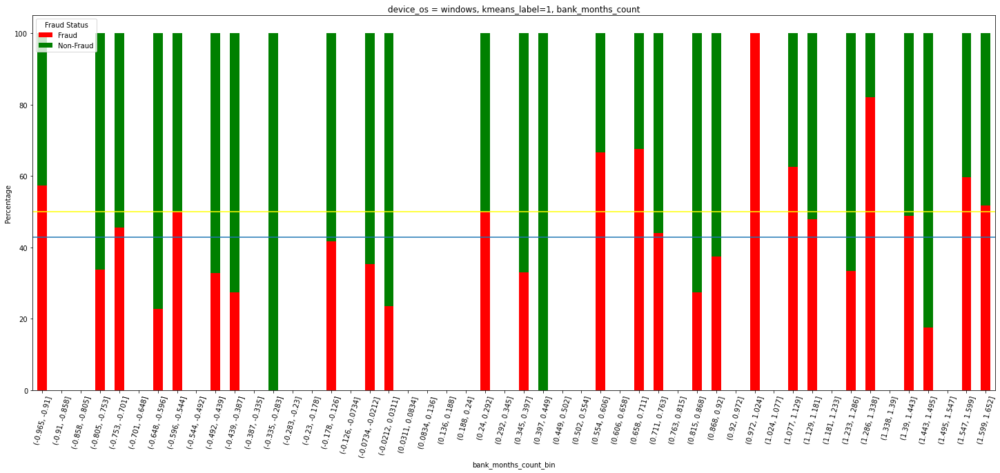

In [114]:
plot_hist_stacked(df_cluster[(df_cluster['device_os']=='windows') & (df_cluster['kmeans_label'].isin([1]))], 'bank_months_count', 'device_os = windows, kmeans_label=1, bank_months_count')

In [115]:
df_cluster[(df_cluster['device_os']=='windows') & (df_cluster['kmeans_label'].isin([1])) & (df_cluster['bank_months_count'] <= -0.901)]['fraud_bool'].value_counts()

1    840
0    624
Name: fraud_bool, dtype: int64

In [116]:
df_cluster[(df_cluster['device_os']=='windows') & (df_cluster['kmeans_label'].isin([1])) & (df_cluster['bank_months_count'] <= -0.901)]['fraud_bool'].value_counts(normalize=True)

1    0.57377
0    0.42623
Name: fraud_bool, dtype: float64

### proposed_credit_limit >= 2.474 (78.4%, 0.5k)

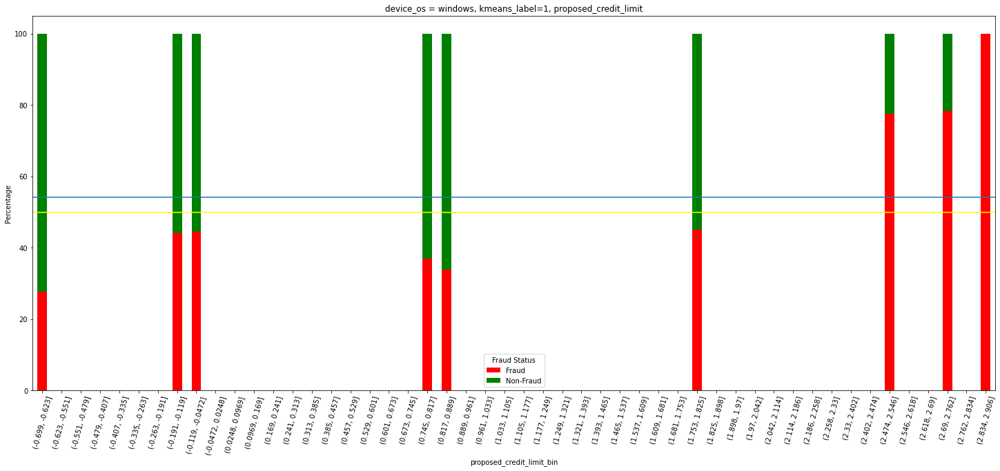

In [117]:
plot_hist_stacked(df_cluster[(df_cluster['device_os']=='windows') & (df_cluster['kmeans_label'].isin([1]))], 'proposed_credit_limit', 'device_os = windows, kmeans_label=1, proposed_credit_limit')

In [118]:
df_cluster[(df_cluster['device_os']=='windows') & (df_cluster['kmeans_label'].isin([1])) & (df_cluster['proposed_credit_limit']>=2.474)]['fraud_bool'].value_counts()

1    392
0    108
Name: fraud_bool, dtype: int64

In [119]:
df_cluster[(df_cluster['device_os']=='windows') & (df_cluster['kmeans_label'].isin([1])) & (df_cluster['proposed_credit_limit']>=2.474)]['fraud_bool'].value_counts(normalize=True)

1    0.784
0    0.216
Name: fraud_bool, dtype: float64

# phone_home_valid = 0, label = 1 (38/9%, 6.5k)

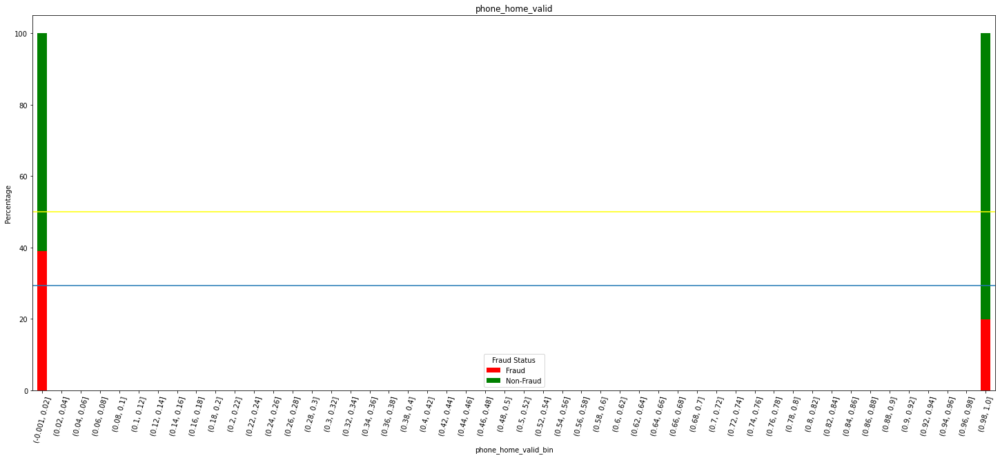

In [120]:
plot_hist_stacked(df_cluster[(df_cluster['kmeans_label'].isin([1]))], 'phone_home_valid', 'phone_home_valid')

In [121]:
df_cluster[(df_cluster['phone_home_valid']==0) & (df_cluster['kmeans_label'].isin([1]))]['fraud_bool'].value_counts()

0    3986
1    2538
Name: fraud_bool, dtype: int64

In [122]:
df_cluster[(df_cluster['phone_home_valid']==0) & (df_cluster['kmeans_label'].isin([1]))]['fraud_bool'].value_counts(normalize=True)

0    0.610975
1    0.389025
Name: fraud_bool, dtype: float64

In [123]:
for col in df_cluster.drop(['fraud_bool', 'kmeans_label'], axis=1).columns:
    
    temp_df = df_cluster[(df_cluster['phone_home_valid']==0) & (df_cluster['kmeans_label'].isin([1]))]
    
    occurrences = temp_df.groupby(["kmeans_label", col, "fraud_bool"]).size().reset_index(name="Occurrences")
    occurrences.sort_values("kmeans_label", inplace=True)
    fig = px.scatter(occurrences, x=col, y='kmeans_label', size="Occurrences", size_max=30, color='fraud_bool')
    fig.show()

## date_of_birth_distinct_emails_4w <= -1.182 (63.1%, 0.6k)

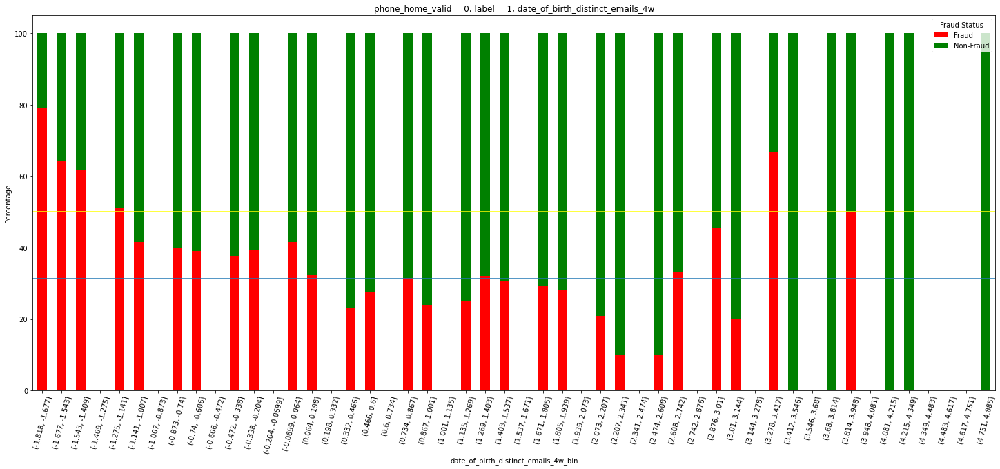

In [124]:
plot_hist_stacked(df_cluster[(df_cluster['kmeans_label'].isin([1])) & (df_cluster['phone_home_valid']==0)], 'date_of_birth_distinct_emails_4w', 'phone_home_valid = 0, label = 1, date_of_birth_distinct_emails_4w')

In [176]:
df_cluster[(df_cluster['kmeans_label'].isin([1])) & (df_cluster['phone_home_valid']==0) & (df_cluster['date_of_birth_distinct_emails_4w']<=-1.409)]['fraud_bool'].value_counts()

1    403
0    235
Name: fraud_bool, dtype: int64

In [177]:
df_cluster[(df_cluster['kmeans_label'].isin([1])) & (df_cluster['phone_home_valid']==0) & (df_cluster['date_of_birth_distinct_emails_4w']<=-1.409)]['fraud_bool'].value_counts(normalize=True)

1    0.631661
0    0.368339
Name: fraud_bool, dtype: float64

## housing_status = BA (53.3%, 3.5k)

In [127]:
df_cluster[(df_cluster['kmeans_label'].isin([1])) & (df_cluster['phone_home_valid']==0) & (df_cluster['housing_status']=='BA')]['fraud_bool'].value_counts()

1    1889
0    1658
Name: fraud_bool, dtype: int64

In [128]:
df_cluster[(df_cluster['kmeans_label'].isin([1])) & (df_cluster['phone_home_valid']==0) & (df_cluster['housing_status']=='BA')]['fraud_bool'].value_counts(normalize=True)

1    0.532563
0    0.467437
Name: fraud_bool, dtype: float64

## device_0s = 'windows' (55.1%, 3k)

In [129]:
df_cluster[(df_cluster['kmeans_label'].isin([1])) & (df_cluster['phone_home_valid']==0) & (df_cluster['device_os']=='windows')]['fraud_bool'].value_counts()

1    1676
0    1367
Name: fraud_bool, dtype: int64

In [130]:
df_cluster[(df_cluster['kmeans_label'].isin([1])) & (df_cluster['phone_home_valid']==0) & (df_cluster['device_os']=='windows')]['fraud_bool'].value_counts(normalize=True)

1    0.550772
0    0.449228
Name: fraud_bool, dtype: float64

# has_other_cards = 0, label = 1 (36.5%, 8.3k)

In [178]:
df_cluster[(df_cluster['kmeans_label'].isin([1])) & (df_cluster['has_other_cards']==0)]['fraud_bool'].value_counts()

0    5317
1    3056
Name: fraud_bool, dtype: int64

In [179]:
df_cluster[(df_cluster['kmeans_label'].isin([1])) & (df_cluster['has_other_cards']==0)]['fraud_bool'].value_counts(normalize=True)

0    0.635017
1    0.364983
Name: fraud_bool, dtype: float64

In [131]:
for col in df_cluster.drop(['fraud_bool', 'kmeans_label'], axis=1).columns:
    
    temp_df = df_cluster[(df_cluster['has_other_cards']==0) & (df_cluster['kmeans_label'].isin([1]))]
    
    occurrences = temp_df.groupby(["kmeans_label", col, "fraud_bool"]).size().reset_index(name="Occurrences")
    occurrences.sort_values("kmeans_label", inplace=True)
    fig = px.scatter(occurrences, x=col, y='kmeans_label', size="Occurrences", size_max=30, color='fraud_bool')
    fig.show()

## date_of_birth_distinct_emails_4w <= -1.309 (57.8%, 1k)

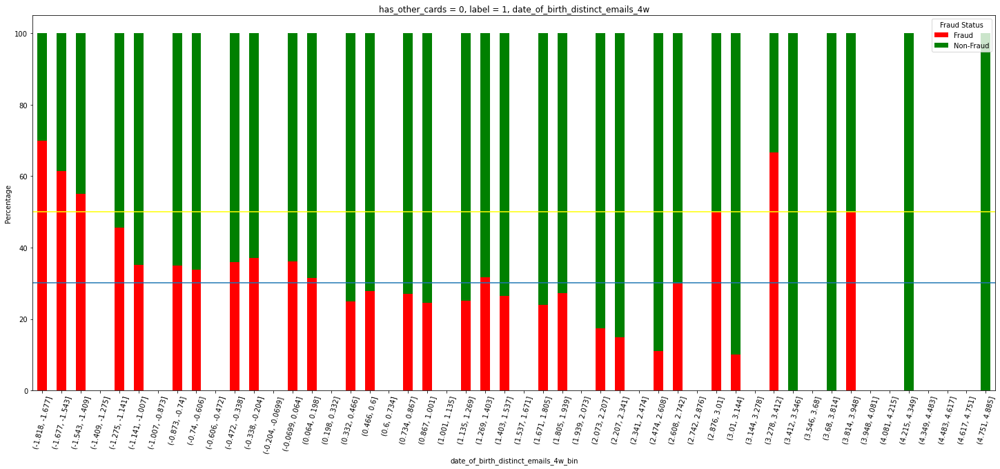

In [132]:
plot_hist_stacked(df_cluster[(df_cluster['kmeans_label'].isin([1])) & (df_cluster['has_other_cards']==0)], 'date_of_birth_distinct_emails_4w', 'has_other_cards = 0, label = 1, date_of_birth_distinct_emails_4w')

In [133]:
df_cluster[(df_cluster['kmeans_label'].isin([1])) & (df_cluster['has_other_cards']==0) & (df_cluster['date_of_birth_distinct_emails_4w']<=-1.409)]['fraud_bool'].value_counts()

1    596
0    436
Name: fraud_bool, dtype: int64

In [134]:
df_cluster[(df_cluster['kmeans_label'].isin([1])) & (df_cluster['has_other_cards']==0) & (df_cluster['date_of_birth_distinct_emails_4w']<=-1.409)]['fraud_bool'].value_counts(normalize=True)

1    0.577519
0    0.422481
Name: fraud_bool, dtype: float64

## credit_risk_score >= 1.8 (56.3%, 1.6k)

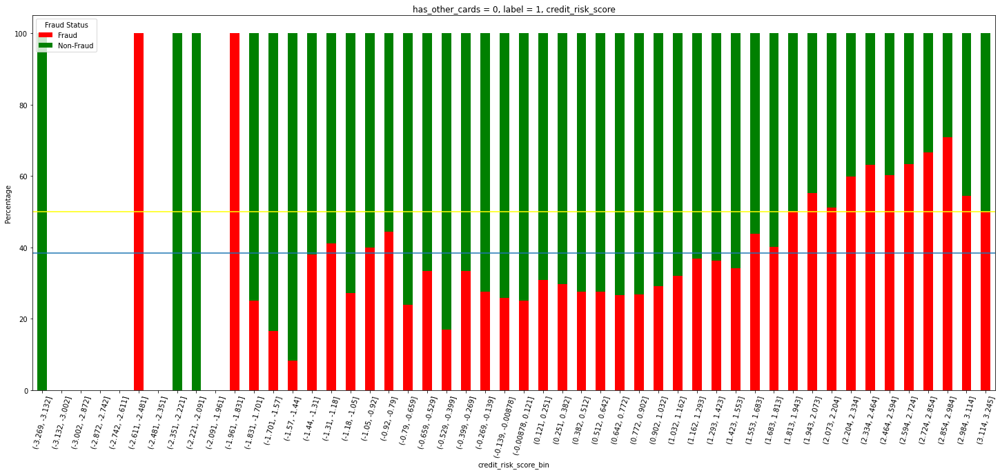

In [135]:
plot_hist_stacked(df_cluster[(df_cluster['kmeans_label'].isin([1])) & (df_cluster['has_other_cards']==0)], 'credit_risk_score', 'has_other_cards = 0, label = 1, credit_risk_score')

In [136]:
df_cluster[(df_cluster['kmeans_label'].isin([1])) & (df_cluster['has_other_cards']==0) & (df_cluster['credit_risk_score']>=1.813)]['fraud_bool'].value_counts()

1    907
0    705
Name: fraud_bool, dtype: int64

In [137]:
df_cluster[(df_cluster['kmeans_label'].isin([1])) & (df_cluster['has_other_cards']==0) & (df_cluster['credit_risk_score']>=1.813)]['fraud_bool'].value_counts(normalize=True)

1    0.562655
0    0.437345
Name: fraud_bool, dtype: float64

# collect conditions and probabilities

In [321]:
condition_list = [
    (df_cluster['device_os']=='windows') & (df_cluster['kmeans_label']==1) & (df_cluster['proposed_credit_limit'] >= 2.474),
    (df_cluster['housing_status']=='BA') & (df_cluster['kmeans_label']==0),
    (df_cluster['device_os']=='windows') & (df_cluster['kmeans_label']==1) & (df_cluster['housing_status'] == 'BA') & (df_cluster['bank_months_count'] <= -0.901),
    (df_cluster['device_os']=='windows') & (df_cluster['kmeans_label']==1) & (df_cluster['housing_status'] == 'BA') & (df_cluster['payment_type'] == 'AC'),
    (df_cluster['device_os']=='windows') & (df_cluster['kmeans_label']==1) & (df_cluster['housing_status'] == 'BA') & (df_cluster['income']>1),
    (df_cluster['device_os']=='windows') & (df_cluster['kmeans_label']==1) & (df_cluster['housing_status'] == 'BA') & (df_cluster['phone_home_valid'] == 0),
    (df_cluster['kmeans_label']==0) & (df_cluster['credit_risk_score']>=0.4),
    (df_cluster['device_os']=='windows') & (df_cluster['kmeans_label']==1) & (df_cluster['housing_status'] == 'BA') & (df_cluster['customer_age']>1),
    (df_cluster['device_os']=='windows') & (df_cluster['kmeans_label']==1) & (df_cluster['credit_risk_score'] >= 1.6),
    (df_cluster['device_os']=='windows') & (df_cluster['kmeans_label']==0),
    (df_cluster['device_os']=='windows') & (df_cluster['kmeans_label']==1) & (df_cluster['date_of_birth_distinct_emails_4w'] <= -1.22),
    (df_cluster['device_os']=='windows') & (df_cluster['kmeans_label']==1) & (df_cluster['housing_status'] == 'BA') & (df_cluster['bank_branch_count_8w']<= 0.189 ),
    (df_cluster['device_os']=='windows') & (df_cluster['kmeans_label']==1) & (df_cluster['housing_status'] == 'BA') & (df_cluster['date_of_birth_distinct_emails_4w']<=0.0207),
    (df_cluster['phone_home_valid']==0) & (df_cluster['kmeans_label']==1) & (df_cluster['date_of_birth_distinct_emails_4w'] <= -1.182),
    (df_cluster['has_other_cards']==0) & (df_cluster['kmeans_label']==1) & (df_cluster['date_of_birth_distinct_emails_4w'] <= -1.309),
    (df_cluster['device_os']=='windows') & (df_cluster['kmeans_label']==1) & (df_cluster['bank_months_count'] <= -0.901),
    (df_cluster['device_os']=='windows') & (df_cluster['kmeans_label']==1) & (df_cluster['housing_status'] == 'BA'),
    (df_cluster['device_os']=='windows') & (df_cluster['kmeans_label']==1) & (df_cluster['income']>1),
    (df_cluster['device_os']=='windows') & (df_cluster['kmeans_label']==1) & (df_cluster['payment_type'] == 'AC'),
    (df_cluster['credit_risk_score']>= 2.2),
    (df_cluster['device_os']=='windows') & (df_cluster['kmeans_label']==1) & (df_cluster['bank_branch_count_8w'] < -0.385),
    (df_cluster['has_other_cards']==0) & (df_cluster['kmeans_label']==1) & (df_cluster['credit_risk_score'] >= 1.8),
    (df_cluster['device_os']=='windows') & (df_cluster['kmeans_label']==1) & (df_cluster['phone_home_valid'] == 0),
    (df_cluster['phone_home_valid']==0) & (df_cluster['kmeans_label']==1) & (df_cluster['housing_status'] == 'BA'),
    (df_cluster['device_os']=='windows') & (df_cluster['kmeans_label']==1) & (df_cluster['email_is_free'] == 1),
    (df_cluster['date_of_birth_distinct_emails_4w'] <= -1.409) & (df_cluster['kmeans_label']==1),
    (df_cluster['device_os']=='windows') & (df_cluster['kmeans_label']==1) & (df_cluster['has_other_cards'] == 0),
    (df_cluster['device_os']=='windows') & (df_cluster['kmeans_label']==1),
    (df_cluster['kmeans_label']==1) & (df_cluster['housing_status']=='BA'),
    (df_cluster['kmeans_label']==0),
    (df_cluster['kmeans_label']==0) & (df_cluster['date_of_birth_distinct_emails_4w'] > 1.4),
    (df_cluster['kmeans_label']==4) & (df_cluster['housing_status']=='BA'),
    (df_cluster['kmeans_label']==3) & (df_cluster['housing_status']=='BA'),
    (df_cluster['kmeans_label']==1),
    (df_cluster['device_os']=='windows'),
    (df_cluster['kmeans_label']==4),
    (df_cluster['kmeans_label']==3),
    (df_cluster['kmeans_label']==2)
]

probability_list = [0.784,
                     0.7182320441988951,
                     0.684322033898305,
                     0.678609062170706,
                     0.6585887384176764,
                     0.6550104384133612,
                     0.642,
                     0.6086036671368125,
                     0.6058897243107769,
                     0.6021505376344086,
                     0.5946445060018467,
                     0.5906344410876133,
                     0.5895710681244744,
                     0.5855072463768116,
                     0.5775193798449613,
                     0.5737704918032787,
                     0.5729963418689724,
                     0.5713582677165354,
                     0.5700615174299385,
                     0.5695159629248198,
                     0.5664575014261266,
                     0.558433734939759,
                     0.5507722642129478,
                     0.532562729066817,
                     0.5224358974358975,
                     0.5131782945736434,
                     0.5012048192771085,
                     0.45865268253327957,
                     0.4510290986515259,
                     0.4230992455020313,
                     0.3706293706293706,
                     0.3555787278415016,
                     0.3225643614336194,
                     0.3137490747594375,
                     0.30641330166270786,
                     0.13373963094633487,
                     0.1131566028473245,
                     0.06378108417438352]

In [322]:
len(condition_list)

38

In [323]:
len(probability_list)

38